# Изучение данных и признаков

Данная программа содержит описание и сам процесс изучения данных, использующихся в соревновании ["Housing Prices Competition for Kaggle Learn Users"](https://www.kaggle.com/competitions/home-data-for-ml-course/overview) на [Kaggle](https://www.kaggle.com/) для последующего построения модели.

В рамках данного соревнования данны два таблицы - тренировочная, где есть таргет, и тестовая, где его нет. В качестве таргета выступает "SalePrice", а остальные признаки могут быть использованя для обычения и предсказания. 

## Загрузка необходимых библиотек

В рамках данной части работы понадобятся библиотеки Numpy, Pandas, Seaborn, Matplotlib и Sklearn.

In [4]:
import numpy as np
import pandas as pd 
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 200)

import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

from sklearn.feature_selection import mutual_info_regression
from sklearn.decomposition import PCA

## Чтение таблиц и первый взгдяд на данные

In [32]:
train_df = pd.read_csv("train.csv", index_col='Id')
test_df = pd.read_csv("test.csv", index_col='Id')

In [33]:
train_df.shape

(1460, 80)

In [34]:
test_df.shape

(1459, 79)

In [35]:
train_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [36]:
test_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


В таблице для тестирования на один столбец меньше, который является SalePrice - таргет данного соревнования.

In [37]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1460 entries, 1 to 1460
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuilt    

Можно увидеть, что датасет имеет несколько признаков с большим количеством отсутствующих данных, что будет рассмотренно подробнее позже.

In [38]:
train_df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [39]:
train_df.describe(include='object').T.sort_values(by=['unique'], ascending=False)

,count,unique,top,freq
Neighborhood,1460,25,NAmes,225
Exterior2nd,1460,16,VinylSd,504
Exterior1st,1460,15,VinylSd,515
SaleType,1460,9,WD,1267
Condition1,1460,9,Norm,1260
Condition2,1460,8,Norm,1445
HouseStyle,1460,8,1Story,726
RoofMatl,1460,8,CompShg,1434
Functional,1460,7,Typ,1360
BsmtFinType2,1422,6,Unf,1256


## Ообработка пропущенных данных

Как можно было увидеть при просмотре общей информации в данных таблицах имеются признаки с пропусками. Рассмотрим их:

In [40]:
def missing_data(df, decim):
    missing = pd.DataFrame(df.isnull().sum().sort_values(ascending=False))
    missing.columns = ["Total"]
    missing = missing.loc[(missing!=0).any(axis=1)]
    len_of_df = len(df) 
    missing["Percent"] = np.around((missing[0:] / len_of_df * 100),decimals=decim)
    return missing
    
missing = missing_data(train_df,10)
missing.style.background_gradient('rocket')

,Total,Percent
PoolQC,1453,99.520548
MiscFeature,1406,96.301370
Alley,1369,93.767123
Fence,1179,80.753425
MasVnrType,872,59.726027
FireplaceQu,690,47.260274
LotFrontage,259,17.739726
GarageYrBlt,81,5.547945
GarageCond,81,5.547945
GarageType,81,5.547945


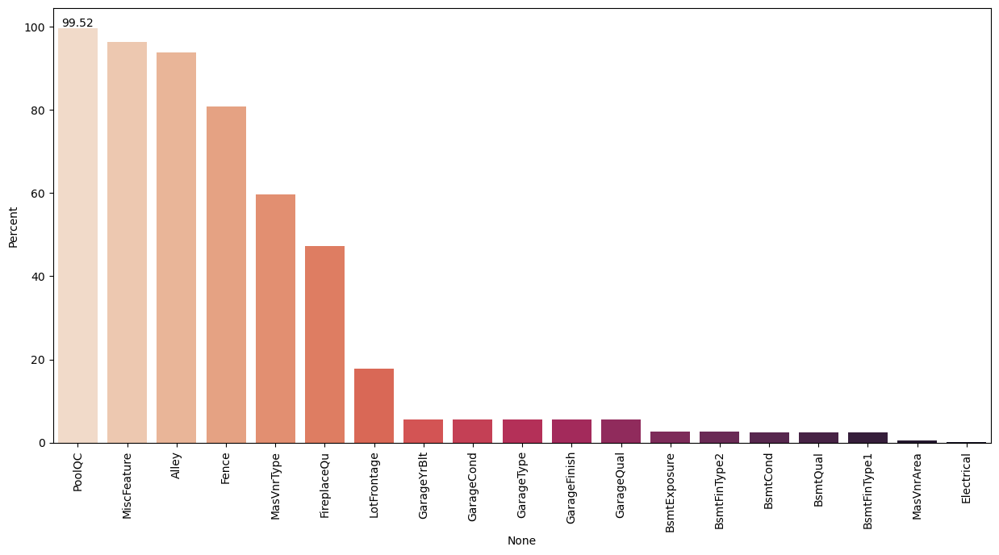

In [41]:
missing = missing_data(train_df,2)
plt.figure(figsize=(15,7))
ax = sns.barplot(x=missing.index, y='Percent', data=missing, palette='rocket_r')
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.show()

In [42]:
missing_data(test_df, 10).style.background_gradient('rocket')

,Total,Percent
PoolQC,1456,99.794380
MiscFeature,1408,96.504455
Alley,1352,92.666210
Fence,1169,80.123372
MasVnrType,894,61.274846
FireplaceQu,730,50.034270
LotFrontage,227,15.558602
GarageYrBlt,78,5.346127
GarageFinish,78,5.346127
GarageQual,78,5.346127


Пропущенные данные в тренировочной и тестовой выборках примерно совпадают. Сам процесс обработки будет представлен ниже в разделе Feature Engineering

## Анализ данных

В первую очередь разделим все признаки на категориальные и числовые для удобства работы с ними.

In [43]:
categorical_features = [feature for feature in train_df.columns if train_df[feature].dtype == "object"] 

numerical_features = [feature for feature in train_df.columns if feature not in categorical_features + ['SalePrice']]

### Числовые признаки

Рассмотрим как числовые признаки изменяются относительно таргета 'SalePrice'

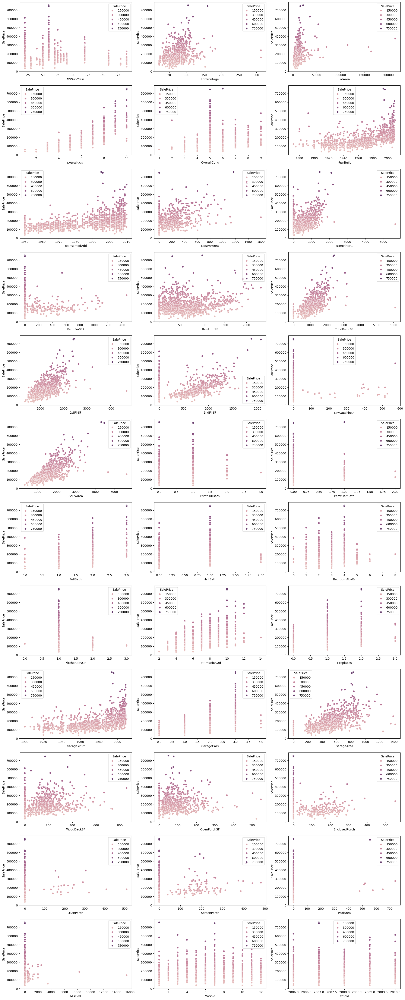

In [44]:
fig, ax = plt.subplots(12, 3, figsize=(23, 60))
cmap = sns.cubehelix_palette(dark=0.3, light=0.8, as_cmap=True)

for var, feature in zip(numerical_features, ax.flatten()):
    sns.scatterplot(x=var, y='SalePrice',  data=train_df, ax=feature, palette=cmap, hue = 'SalePrice')
    plt.legend(loc='best', prop={'size': 10})

Наблюдения:
- OverallQual - цена продажи дома растет вместе с общим качеством.

- OverallCondition - общее состояние является неравномерным, поскольку большинство домов находятся в состоянии примерно 5/10. Данный признак не влияет на цену, также как показатель общего качества.

- Объекты GarageYrBlt, YearBuilt и YearRemodAdd - являются порядковыми признаками, но на их графиках можно увидеть линейную зависимость. Дома, построенные недавно, с большей вероятностью будут продаваться по более высоким ценам.

- Basement - большие подвалы увеличивают цену, но имеется ряд выбросов.

- GrLivArea - эта характеристика довольно линейна, но можно выделить два отклонения, влияющих на эту тенденцию. Есть несколько домов большой площади с довольно низкими ценами, возможно, за этим стоит какая-то причина, но лучше отказаться от них в рамках данной работы.

Также для улучшения модели стоит избавиться от нескольких выбросов, что позволительно в рамках данной модели, т.к. нет задачи определять эти самые выбросы. В ряде случаев можно использовать другие способы борьбы с выбросами. 

In [45]:
train_df = train_df.drop(train_df[(train_df['GrLivArea'] > 4000)
                                  & (train_df['SalePrice'] < 200000)].index)
train_df = train_df.drop(train_df[(train_df['GarageArea'] > 1200)
                                  & (train_df['SalePrice'] < 300000)].index)
train_df = train_df.drop(train_df[(train_df['TotalBsmtSF'] > 4000)
                                  & (train_df['SalePrice'] < 200000)].index)
train_df = train_df.drop(train_df[(train_df['1stFlrSF'] > 4000)
                                  & (train_df['SalePrice'] < 200000)].index)
train_df = train_df.drop(train_df[(train_df['TotRmsAbvGrd'] > 12)
                                  & (train_df['SalePrice'] < 230000)].index)
train_df = train_df.drop(train_df[(train_df['OverallQual'] < 5)
                                  & (train_df['SalePrice'] > 200000)].index)
y = train_df.SalePrice

Рассмотрим корреляцию числовых признаков

<Axes: >

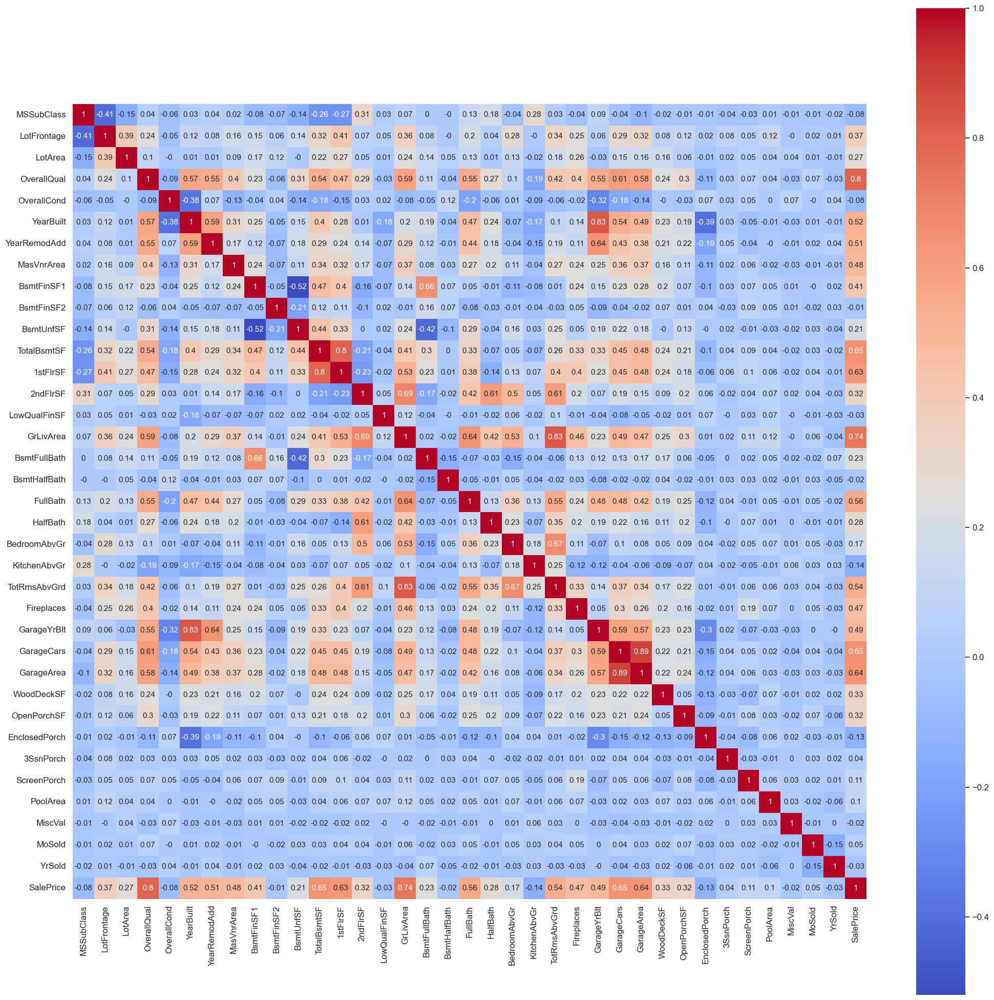

In [46]:
# Display correlations between numerical features and saleprice on heatmap.

sns.set(font_scale=1.1)
correlation_train = train_df[numerical_features + ['SalePrice']].corr()
mask = np.triu(correlation_train.corr())
plt.figure(figsize=(25, 25))
sns.heatmap(correlation_train.round(2), annot=True, square=True, cmap='coolwarm', annot_kws={'size': 11})

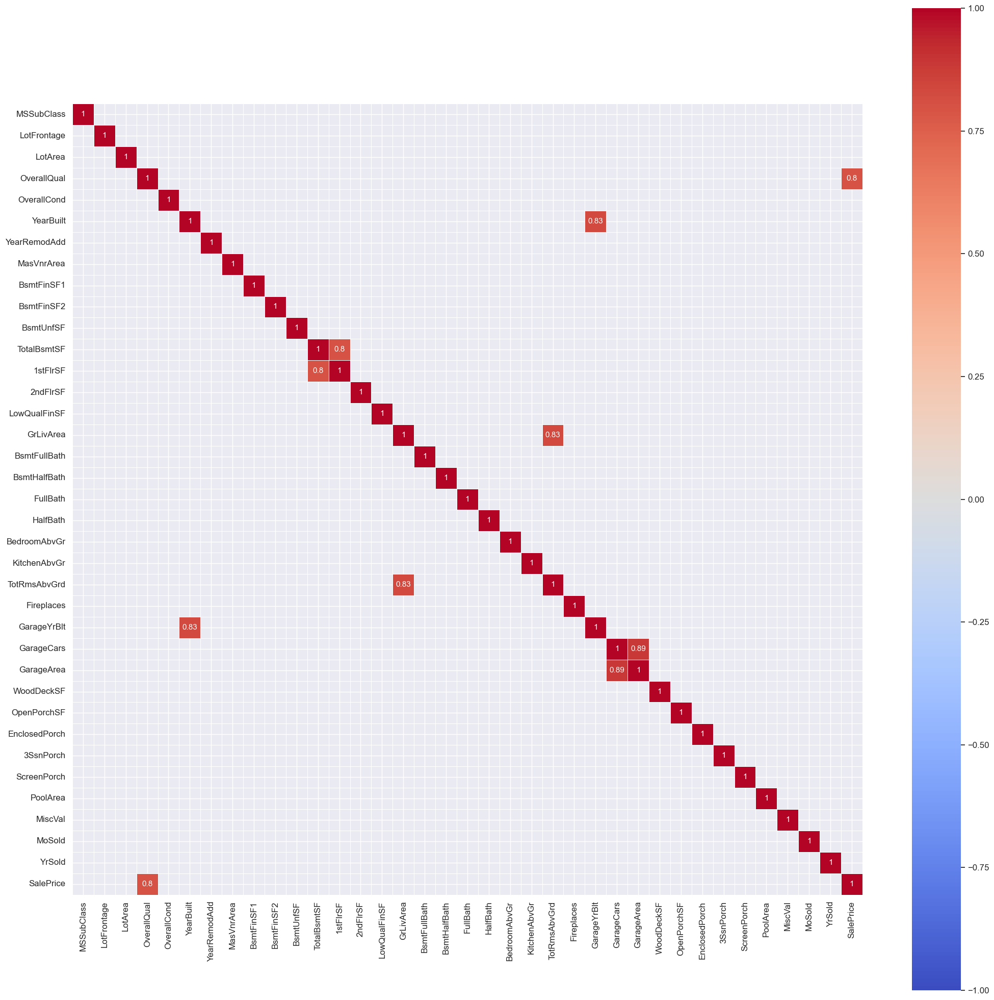

In [47]:
plt.figure(figsize=(25, 25))
sns.heatmap(correlation_train.round(2), annot=True, square=True, mask=correlation_train <0.75, 
            linewidth=0.5, cmap='coolwarm', vmin=-1, annot_kws={'size': 11})
plt.show()

Наблюдения:

- Как было замечено ранее 'OverallQual' сильно коррелирует с ценой продажи дома.
- 'GrLivArea' является важным признаком для определения цены продажи.
- Характеристики гаража, количество ванн и комнат, возраст здания и т.д. также в разной степени влияют на цену.
- Есть несколько очевидных соотношений, которые рассмотрим, например, общая площадь в квадратных футах, влияющая на количество комнат в доме или на то, сколько автомобилей может поместиться в гараже, в зависимости от площади гаража и т.д.
- 'OverallCond' кажется менее важным для ценообразования, это интересно и стоит того, чтобы в нем разобраться.


Сильно коррелированные переменные:

- GarageYrBlt and YearBuilt
- TotRmsAbvGrd and GrLivArea
- 1stFlrSF and TotalBsmtSF
- GarageArea and GarageCars

Сильно коррелированные переменные могут быть исключены при желании или быть преобразованны в новые принзнаки при помощи эмпирических предположений или метода PCA, чтобы избежать мультиколлинеарности.


--------------------------------------------------


Корреляция - хороший показатель для понимания взаимосвязей между признаками и целевой переменной. Но он измеряет только линейные взаимосвязи.

Взаимная информация (mutual information) - это еще один показатель, который также позволяет измерять более разнообразные взаимосвязи.

Стоит обратить внимание, что эти два показателя хороши только для одномерного анализа и не могут выявить многомерные взаимосвязи.

In [48]:
mutual_df = train_df[numerical_features]

mutual_info = mutual_info_regression(mutual_df.fillna(0), y, random_state=1)
mutual_info = pd.Series(mutual_info)
mutual_info.index = mutual_df.columns
pd.DataFrame(mutual_info.sort_values(ascending=False), columns = ["Numerical_Feature_MI"] ).style.background_gradient("rocket")

,Numerical_Feature_MI
OverallQual,0.569148
GrLivArea,0.488577
GarageCars,0.396907
GarageArea,0.375959
YearBuilt,0.375644
TotalBsmtSF,0.375393
1stFlrSF,0.314975
MSSubClass,0.275980
GarageYrBlt,0.262027
FullBath,0.255855


### Категориальные признаки

Рассмотрим как категориальные признаки изменяются относительно таргета 'SalePrice'

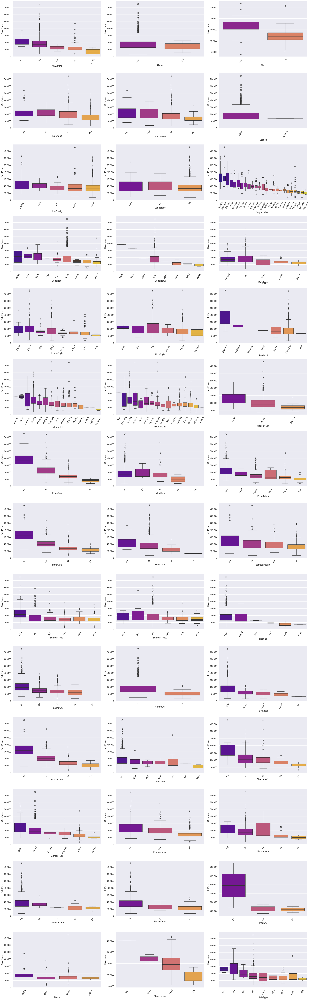

In [49]:
fig, ax = plt.subplots(14, 3, figsize=(25, 80))

for i, j in zip(categorical_features, ax.flatten()):
    sortd = train_df.groupby([i])['SalePrice'].median().sort_values(ascending=False)
    sns.boxplot(x=i,
                y='SalePrice',
                data=train_df,
                palette='plasma',
                order=sortd.index,
                ax=j)
    for ax in fig.axes:
        plt.sca(ax)
        plt.xticks(rotation=60)

    plt.tight_layout()

Наблюдения:

- Некоторые признаки, отвечающие за Quality, склонны иметь относительно значимую корреляцию с ценой.
- Признак 'Neighbourhood' - соседство тоже относительно неплохо коррелирует с таргетом.

Проверим гипотезы при помощи вычисления MI категориальных признаков.

In [50]:
mutual_df_categorical = train_df[categorical_features]
# категориальные признаки нужно преобразовать, чтобы посчитать mutual information
for colname in mutual_df_categorical:
    mutual_df_categorical[colname], _ = mutual_df_categorical[colname].factorize()
mutual_info = mutual_info_regression(mutual_df_categorical.fillna("None"), y, random_state=1)

mutual_info = pd.Series(mutual_info)
mutual_info.index = mutual_df_categorical.columns
pd.DataFrame(mutual_info.sort_values(ascending=False), columns = ["Categorical_Feature_MI"] ).style.background_gradient("cool")

,Categorical_Feature_MI
Neighborhood,0.495697
BsmtQual,0.328873
KitchenQual,0.328685
ExterQual,0.324453
GarageFinish,0.270466
GarageType,0.220789
FireplaceQu,0.209405
Foundation,0.196164
HeatingQC,0.158488
Exterior2nd,0.154949


Предположения оправдались.

### Сравнения распределения признаков в тренировочной и тестевой выборках

Как можно будет увидеть признаков распределены примерно одинаково в обеих выборках, что не должно создать проблем при создании модели

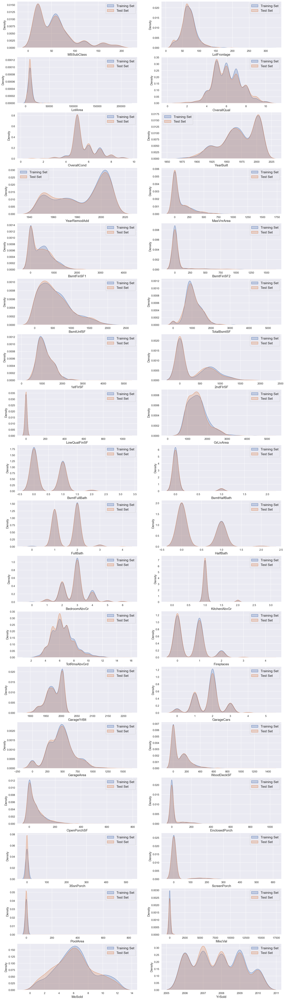

In [51]:
fig, axs = plt.subplots(ncols=2, nrows=18, figsize=(12, 80))
plt.subplots_adjust(right=1.5)

for i, feature in enumerate(numerical_features, 1):    
    plt.subplot(18, 2, i)
    sns.kdeplot(train_df[feature], bw='silverman', label='Training Set', shade=True)
    sns.kdeplot(test_df[feature], bw='silverman', label='Test Set', shade=True)
        
    plt.xlabel('{}'.format(feature), size=15)
    
    for j in range(2):
        plt.tick_params(axis='x', labelsize=12)
        plt.tick_params(axis='y', labelsize=12)
    
    plt.legend(loc='best', prop={'size': 15})
        
plt.show()

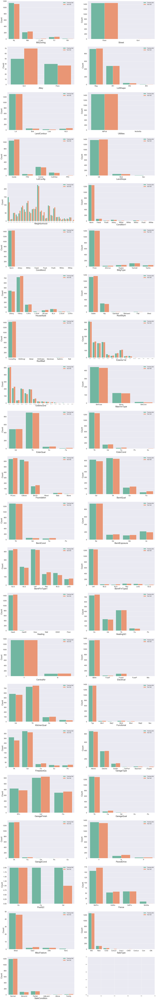

In [52]:
train_copy = train_df.copy()
test_copy = test_df.copy()

train_copy['Dataset'] = 'Training Set'
test_copy['Dataset'] = 'Test Set'
df_all = pd.concat([train_copy, test_copy])

fig, axs = plt.subplots(ncols=2, nrows=22, figsize=(18, 120))
plt.subplots_adjust(right=1.5, top=1.5)

for i, feature in enumerate(categorical_features, 1):    
    plt.subplot(22, 2, i)
    sns.countplot(x=feature, hue='Dataset', data=df_all, palette='Set2')
        
    plt.xlabel('{}'.format(feature), size=25)
    plt.ylabel('Count', size=25)
    
    for j in range(2):
        if train_copy[feature].value_counts().shape[0] > 10:        
            plt.tick_params(axis='x', labelsize=7)
        else:
            plt.tick_params(axis='x', labelsize=20)
        plt.tick_params(axis='y', labelsize=20)
        
    plt.legend(loc='upper right', prop={'size': 15})
            
plt.show()

### Feature Engineering

Пропущенные значения будут обработаны следующим образом:

- Сначала заполним пропущенные данные в столбцах, где они означают, что их нет, и заменяем их на 'None'.
- Затем заполним числовые столбцы, в которых отсутствуют значения, из-за отсутствие родительского объекта (пример: 'GarageCond' - отсутствует, когда у дома нет гаража), поэтому заполним их 0.
- Даже с учетом этого есть некоторые фактически недостающие данные, но, проверив общие тенденции этих функций, мы можем заполнить их наиболее часто используемым значением (с помощью mode).
- Часть 'MSZoning' немного сложна, заполним его наиболее часто используемым типом связанного типа 'MSSubClass'. Это не идеально, но, по крайней мере, мы немного уменьшаем случайность.
- Заполняем 'LotFrontage' аналогичным образом.

Эта часть будет реализована перед проверкой новых признаков и в пайплайне в рамках модели.

При этом столбцы "PoolQC", "MiscFeature" и "Alley", которые имеют слишком много пропущенных значений будут удалены в процессе.

In [53]:
# Список признаков, где NaN значит, что его нет.

none_cols = [
    'Alley', 'PoolQC', 'MiscFeature', 'Fence', 'FireplaceQu', 'GarageType',
    'GarageFinish', 'GarageQual', 'GarageCond', 'BsmtQual', 'BsmtCond',
    'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'MasVnrType'
]

# Список признаков, где NaN значит 0.

zero_cols = [
    'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'BsmtFullBath',
    'BsmtHalfBath', 'GarageYrBlt', 'GarageArea', 'GarageCars', 'MasVnrArea'
]

# Список признаков, где NaN на самом деле пропущен по той или иной причине и будет заменен mode.

freq_cols = [
    'Electrical', 'Exterior1st', 'Exterior2nd', 'Functional', 'KitchenQual',
    'SaleType', 'Utilities'
]

for col in zero_cols:
    train_df[col].replace(np.nan, 0, inplace=True)

for col in none_cols:
    train_df[col].replace(np.nan, 'None', inplace=True)

for col in freq_cols:
    train_df[col].replace(np.nan, train_df[col].mode()[0], inplace=True)

# Заполнение пропусков 'MSZoning' согласно MSSubClass.

train_df['MSZoning'] = train_df.groupby('MSSubClass')['MSZoning'].apply(lambda x: x.fillna(x.mode()[0])).reset_index(level=0, drop=True)

# Заполнение пропусков 'LotFrontage' согласно Neighborhood.

train_df['LotFrontage'] = train_df.groupby(
    ['Neighborhood'])['LotFrontage'].apply(lambda x: x.fillna(x.median())).reset_index(level=0, drop=True)

Далее преобразуем некоторые из категориальных признаков в числовые, особенно те, которые связаны с качеством конкретных объектов. Для этого выбираем близкие значения для формирования более близких групп, чтобы, по-возможности, сохранить линейные отношения...

In [54]:
neigh_map = {
    'MeadowV': 1,
    'IDOTRR': 1,
    'BrDale': 1,
    'BrkSide': 2,
    'OldTown': 2,
    'Edwards': 2,
    'Sawyer': 3,
    'Blueste': 3,
    'SWISU': 3,
    'NPkVill': 3,
    'NAmes': 3,
    'Mitchel': 4,
    'SawyerW': 5,
    'NWAmes': 5,
    'Gilbert': 5,
    'Blmngtn': 5,
    'CollgCr': 5,
    'ClearCr': 6,
    'Crawfor': 6,
    'Veenker': 7,
    'Somerst': 7,
    'Timber': 8,
    'StoneBr': 9,
    'NridgHt': 10,
    'NoRidge': 10
}

train_df['Neighborhood'] = train_df['Neighborhood'].map(neigh_map).astype('int')
ext_map = {'None': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5}
train_df['ExterQual'] = train_df['ExterQual'].map(ext_map).astype('int')
train_df['ExterCond'] = train_df['ExterCond'].map(ext_map).astype('int')
bsm_map = {'None': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5}
train_df['BsmtQual'] = train_df['BsmtQual'].map(bsm_map).astype('int')
train_df['BsmtCond'] = train_df['BsmtCond'].map(bsm_map).astype('int')
bsmf_map = {
    'None': 0,
    'Unf': 1,
    'LwQ': 2,
    'Rec': 3,
    'BLQ': 4,
    'ALQ': 5,
    'GLQ': 6
}

train_df['BsmtFinType1'] = train_df['BsmtFinType1'].map(bsmf_map).astype('int')
train_df['BsmtFinType2'] = train_df['BsmtFinType2'].map(bsmf_map).astype('int')
heat_map = {'None': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5}
train_df['HeatingQC'] = train_df['HeatingQC'].map(heat_map).astype('int')
train_df['KitchenQual'] = train_df['KitchenQual'].map(heat_map).astype('int')
train_df['FireplaceQu'] = train_df['FireplaceQu'].map(bsm_map).astype('int')
train_df['GarageCond'] = train_df['GarageCond'].map(bsm_map).astype('int')
train_df['GarageQual'] = train_df['GarageQual'].map(bsm_map).astype('int')

В этой части создаем новый признаки, которые могут улучшить понимание модели относительно данной задачи. Будем использовать базовый подход, объединив некоторые важные признаки, тем самым сделав их более эффективными. 

P.S. Идеи некоторых признаков были получены после изучения форумов каксательно данного соревнования. Особенно сложные вариации не брались и в основе так или иначе лежат простые идеи.

In [57]:
train_df["Lack_of_feature_index"] = train_df[["Street", "Alley", "MasVnrType", "GarageType", "MiscFeature",  'BsmtQual', 'FireplaceQu','PoolQC','Fence']].isnull().sum(axis=1) + (train_df["MasVnrType"] == 'None')+ (train_df["CentralAir"] == 'No')
train_df["Lot_occupation"] = train_df["GrLivArea"]  / train_df["LotArea"]
train_df["Number_of_floors"] = (train_df["TotalBsmtSF"] != 0).astype('int64') + (train_df["1stFlrSF"] != 0).astype('int64') + (train_df["2ndFlrSF"] != 0).astype('int64')
train_df['Total_Close_Live_Area'] = train_df['GrLivArea'] + train_df['TotalBsmtSF'] 
train_df['Outside_live_area'] =  train_df['WoodDeckSF'] + train_df['OpenPorchSF'] + train_df['EnclosedPorch']+ train_df['3SsnPorch'] + train_df['ScreenPorch']
train_df['Total_usable_area'] = train_df['Total_Close_Live_Area'] + train_df['Outside_live_area']
train_df['Area_Quality_Indicator'] = train_df['Total_usable_area'] * train_df['OverallQual']
train_df['Area_Qual_Cond_Indicator'] = train_df['Total_usable_area'] * train_df['OverallQual']* train_df['OverallCond']
train_df['TotalBath'] = (train_df['FullBath'] + (0.5 * train_df['HalfBath']) + train_df['BsmtFullBath'] + (0.5 * train_df['BsmtHalfBath']))
train_df['House_Age'] = train_df['YrSold'].astype('int64') - train_df['YearBuilt']
train_df["Is_Remodeled"] = (train_df["YearBuilt"] != train_df["YearRemodAdd"]).astype('int64')
train_df['Quality_conditition'] = train_df['OverallQual']* train_df['OverallCond']
train_df['Quality_conditition_2'] = train_df['OverallQual'] + train_df['OverallCond']
train_df['House_Age2'] = train_df['YrSold'].astype('int64') - train_df['YearRemodAdd']

# Создание новых признаков на основе предыдущих наблюдений

train_df['TotalSF'] = (train_df['BsmtFinSF1'] + train_df['BsmtFinSF2'] +
                       train_df['1stFlrSF'] + train_df['2ndFlrSF'])

train_df['YearBlRm'] = (train_df['YearBuilt'] + train_df['YearRemodAdd'])

# Объединение признаков quality и condition

train_df['TotalExtQual'] = (train_df['ExterQual'] + train_df['ExterCond'])
train_df['TotalBsmQual'] = (train_df['BsmtQual'] + train_df['BsmtCond'] +
                            train_df['BsmtFinType1'] + train_df['BsmtFinType2'])
train_df['TotalGrgQual'] = (train_df['GarageQual'] + train_df['GarageCond'])
train_df['TotalQual'] = train_df['OverallQual'] + train_df['TotalExtQual'] + train_df['TotalBsmQual'] + train_df['TotalGrgQual'] + train_df['KitchenQual'] + train_df['HeatingQC']

# Создание признаков на основе новых показателей качества

train_df['QualGr'] = train_df['TotalQual'] * train_df['GrLivArea']
train_df['QualBsm'] = train_df['TotalBsmQual'] * (train_df['BsmtFinSF1'] + train_df['BsmtFinSF2'])
train_df['QualExt'] = train_df['TotalExtQual'] * train_df['MasVnrArea']
train_df['QualGrg'] = train_df['TotalGrgQual'] * train_df['GarageArea']
train_df['QlLivArea'] = (train_df['GrLivArea'] - train_df['LowQualFinSF']) * (train_df['TotalQual'])
train_df['QualSFNg'] = train_df['QualGr'] * train_df['Neighborhood']
train_df["Spaciousness"] = (train_df["1stFlrSF"] + train_df["2ndFlrSF"]) / train_df.TotRmsAbvGrd
train_df["Feature"] = train_df.GrLivArea + train_df.TotalBsmtSF
train_df['HasPool'] = train_df['PoolArea'].apply(lambda x: 1 if x > 0 else 0)
train_df['Has2ndFloor'] = train_df['2ndFlrSF'].apply(lambda x: 1 if x > 0 else 0)
train_df['HasGarage'] = train_df['QualGrg'].apply(lambda x: 1 if x > 0 else 0)
train_df['HasBsmt'] = train_df['QualBsm'].apply(lambda x: 1 if x > 0 else 0)
train_df['HasFireplace'] = train_df['Fireplaces'].apply(lambda x: 1 if x > 0 else 0)

new_features = list(set(train_df.columns) - set(categorical_features+numerical_features+['SalePrice']))
new_continuous_features= ["Lot_occupation", 'Total_Close_Live_Area', 'Outside_live_area', 'Total_usable_area',
                          'Area_Quality_Indicator', 'House_Age',  'Area_Qual_Cond_Indicator', 'House_Age2', 'YearBlRm',
                           'QualGr','QualBsm', 'QualExt', 'QualGrg', 'QlLivArea','TotalQual', 'TotalSF','QualSFNg', 'Spaciousness', 'Feature']
new_discrete_features = ["Lack_of_feature_index", "Number_of_floors",  'HasPool', 'Has2ndFloor', 'HasFireplace', "HasGarage", 
                         "Is_Remodeled", 'TotalBath', 'HasBsmt',  'TotalExtQual', 'TotalBsmQual', 'TotalGrgQual'] 


assert new_features.sort() == (new_discrete_features + new_continuous_features).sort()

Посмотрим MI новых признаков

In [56]:
mutual_df = train_df[new_features]

mutual_info = mutual_info_regression(mutual_df.fillna(0), y, random_state=1)

mutual_info = pd.Series(mutual_info)
mutual_info.index = mutual_df.columns
pd.DataFrame(mutual_info.sort_values(ascending=False), columns = ["New_Feature_MI"] ).style.background_gradient("cool")

,New_Feature_MI
Area_Quality_Indicator,0.943017
QualSFNg,0.893818
QlLivArea,0.775653
QualGr,0.763923
Area_Qual_Cond_Indicator,0.741076
Total_Close_Live_Area,0.667554
Feature,0.667294
Total_usable_area,0.640741
TotalQual,0.511895
TotalSF,0.476294


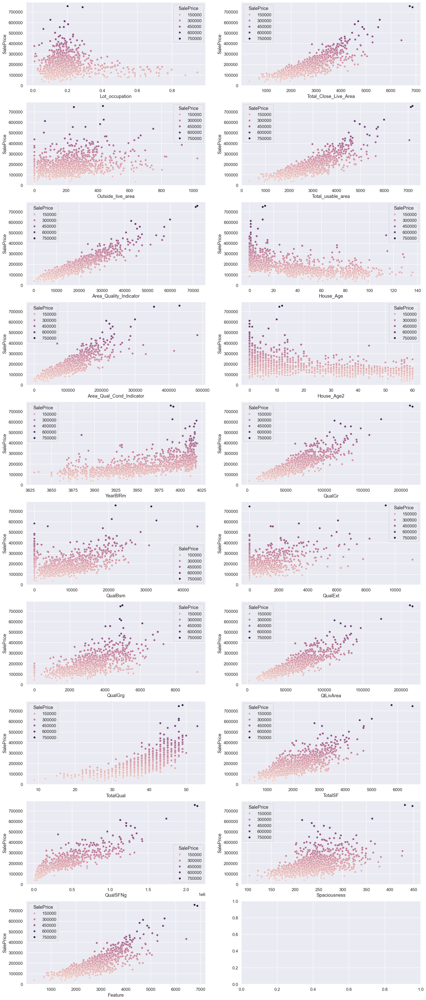

In [58]:
fig, ax = plt.subplots(10, 2, figsize=(20, 50))
for var, subplot in zip(new_continuous_features, ax.flatten()):
    sns.scatterplot(x=var, y='SalePrice',  data=train_df, ax=subplot, hue = 'SalePrice')

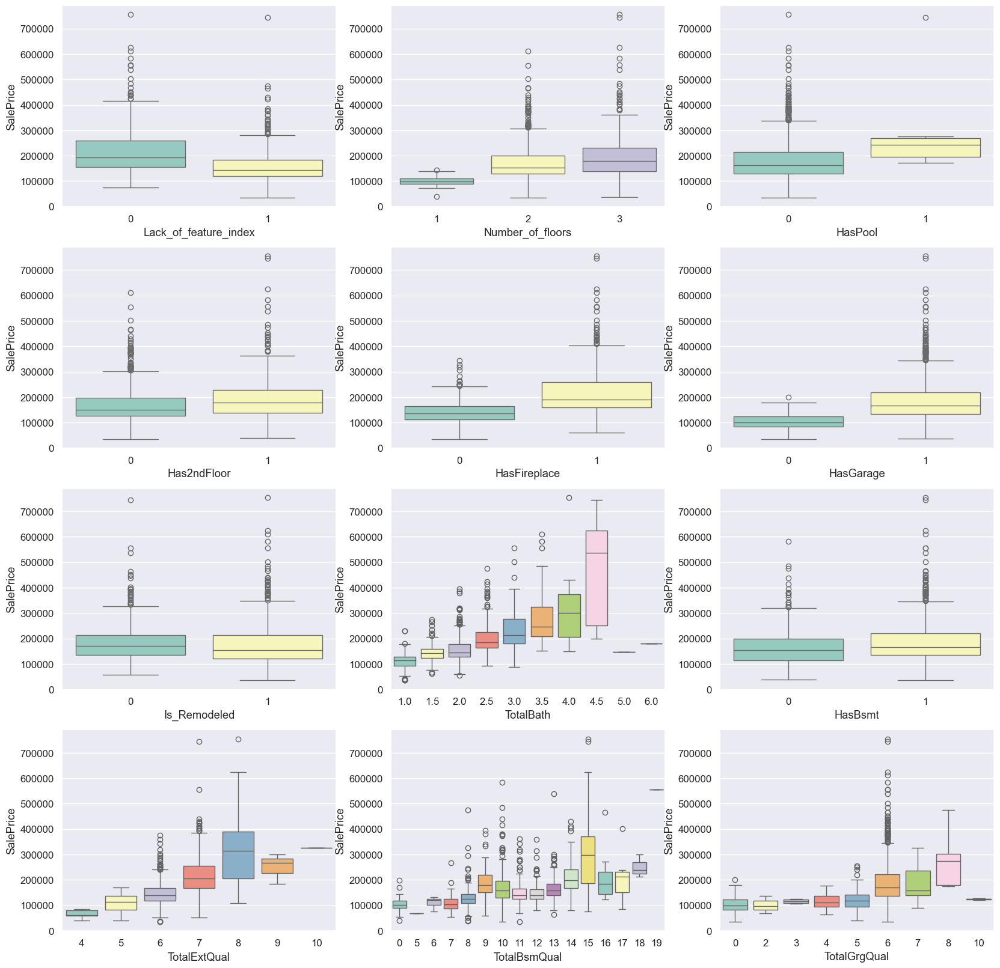

In [59]:
fig, ax = plt.subplots(4, 3, figsize=(20, 20))
for var, subplot in zip(new_discrete_features, ax.flatten()):
    sns.boxplot(x=var, y='SalePrice',  data=train_df, ax=subplot, palette='Set3')

In [60]:
categorical_features = [feature for feature in train_df.columns if
                    train_df[feature].dtype == "object"]

numerical_features = list(set(train_df.columns) - set(categorical_features)) 

In [61]:
columns_to_be_dropped = ["MoSold","BsmtFinSF2","3SsnPorch","YrSold","Street","Condition2","PoolQC","Utilities",
                   "PoolQC","MiscFeature","Alley","Fence","FireplaceQu","GarageYrBlt","YearBuilt","YearRemodAdd"]

<Axes: >

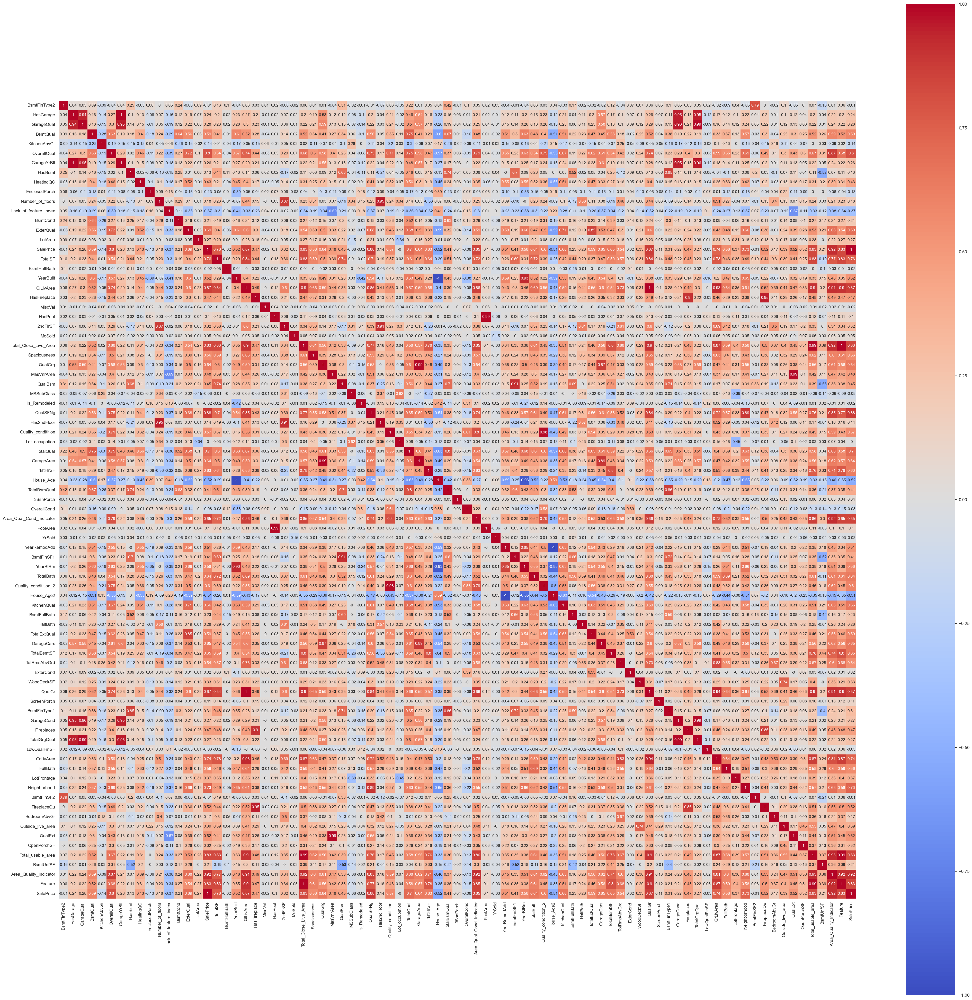

In [62]:
# Display correlations between numerical features and saleprice on heatmap.

sns.set(font_scale=1.1)
correlation_train = train_df[numerical_features + ['SalePrice']].corr()
mask = np.triu(correlation_train.corr())
plt.figure(figsize=(50, 50))
sns.heatmap(correlation_train.round(2), annot=True, square=True, cmap='coolwarm', annot_kws={'size': 11})

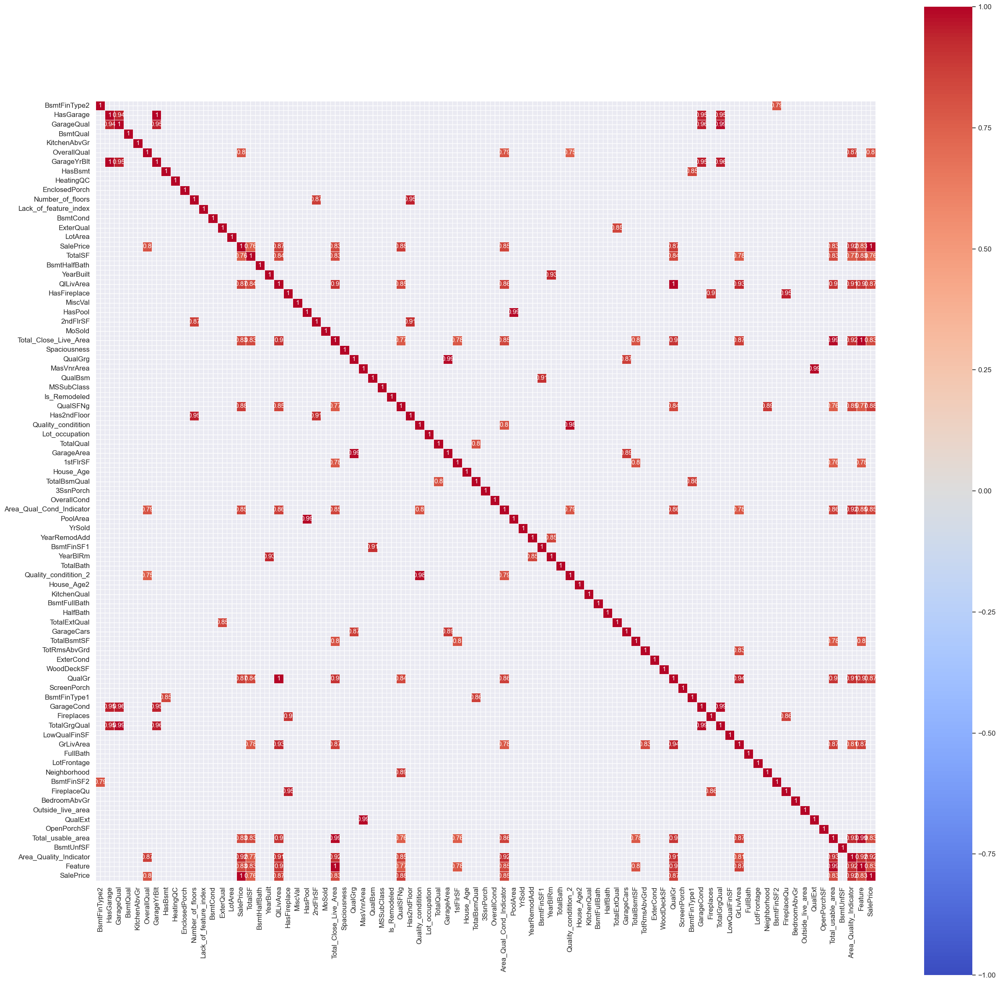

In [63]:
plt.figure(figsize=(30, 30))
sns.heatmap(correlation_train.round(2), annot=True, square=True, mask=correlation_train <0.75, 
            linewidth=0.5, cmap='coolwarm', vmin=-1, annot_kws={'size': 11})
plt.show()

Один из вариантов обхода мультиколлинеарность - применение метода главных компонент (PCA), в данной работе он пока не будет применяться в силу отсутствия острой необходимости, вывод о которой был сформирован по итогу получения информации об успешности модели в рамках соревнования.

Однако в общем случае, как минимум, лучше хотя бы проверить как будет себя вести модель (у которой есть проблема с мультиколлинеарностью) после применения PCA

Небольшое уточнение: Данный метод (PCA) может применяться не только для решения проблемы мультиколлинеарности, но и для поиска и создания потенциальных неочевидных новых признаков, которые можно будет добавить в выборку для последующего обучения на них модели (изначально данный метод так и использовался). 

In [64]:
def apply_pca(X, standardize=True):
    # Standardize
    if standardize:
        X = (X - X.mean(axis=0)) / X.std(axis=0)
    # Create principal components
    pca = PCA()
    X_pca = pca.fit_transform(X)
    # Convert to dataframe
    component_names = [f"PC{i+1}" for i in range(X_pca.shape[1])]
    X_pca = pd.DataFrame(X_pca, columns=component_names)
    # Create loadings
    loadings = pd.DataFrame(
        pca.components_.T,  # transpose the matrix of loadings
        columns=component_names,  # so the columns are the principal components
        index=X.columns,  # and the rows are the original features
    )
    return pca, X_pca, loadings


def plot_variance(pca, width=8, dpi=100):
    # Create figure
    fig, axs = plt.subplots(1, 2)
    n = pca.n_components_
    grid = np.arange(1, n + 1)
    # Explained variance
    evr = pca.explained_variance_ratio_
    axs[0].bar(grid, evr)
    axs[0].set(
        xlabel="Component", title="% Explained Variance", ylim=(0.0, 1.0)
    )
    # Cumulative Variance
    cv = np.cumsum(evr)
    axs[1].plot(np.r_[0, grid], np.r_[0, cv], "o-")
    axs[1].set(
        xlabel="Component", title="% Cumulative Variance", ylim=(0.0, 1.0)
    )
    # Set up figure
    fig.set(figwidth=8, dpi=100)
    return axs

# features = [
#     "GarageArea",
#     "YearRemodAdd",
#     "TotalBsmtSF",
#     "GrLivArea",
# ]
# X = train_df.copy()
# y = X.pop("SalePrice")
# X = X.loc[:, features]
# pca, X_pca, loadings = apply_pca(X)
# print(loadings)